# CLUSTERING

In [ ]:
#4.2  Create DataFrame for each cluster that shows data according to the areas.

In [1]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

url = "https://github.com/priyadeepgupta/capstone/raw/main/Statewise_crimes_committed.xlsx"
crime_data = pd.read_excel(url)

X = crime_data[['MURDER','RAPE','KIDNAPPING & ABDUCTION']]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=3, random_state=42)
crime_data['Cluster'] = kmeans.fit_predict(X_scaled)

print(crime_data[['DISTRICT', 'Cluster']])


C:\Users\sanja\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


           DISTRICT  Cluster
0          ADILABAD        0
1         ANANTAPUR        0
2          CHITTOOR        0
3          CUDDAPAH        0
4     EAST GODAVARI        0
...             ...      ...
9012    LAKSHADWEEP        0
9013          TOTAL        0
9014       KARAIKAL        0
9015     PUDUCHERRY        0
9016          TOTAL        0

[9017 rows x 2 columns]


         STATE/UT       DISTRICT  YEAR  MURDER  ATTEMPT TO MURDER  \
0  ANDHRA PRADESH       ADILABAD  2001     101                 60   
1  ANDHRA PRADESH      ANANTAPUR  2001     151                125   
2  ANDHRA PRADESH       CHITTOOR  2001     101                 57   
3  ANDHRA PRADESH       CUDDAPAH  2001      80                 53   
4  ANDHRA PRADESH  EAST GODAVARI  2001      82                 67   

   CULPABLE HOMICIDE NOT AMOUNTING TO MURDER  RAPE  CUSTODIAL RAPE  \
0                                         17    50               0   
1                                          1    23               0   
2                                          2    27               0   
3                                          1    20               0   
4                                          1    23               0   

   OTHER RAPE  KIDNAPPING & ABDUCTION  ...  ARSON  HURT/GREVIOUS HURT  \
0          50                      46  ...     30                1131   
1          23     

C:\Users\sanja\AppData\Local\Temp\ipykernel_18924\2013627962.py:19: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = crime_data.corr()


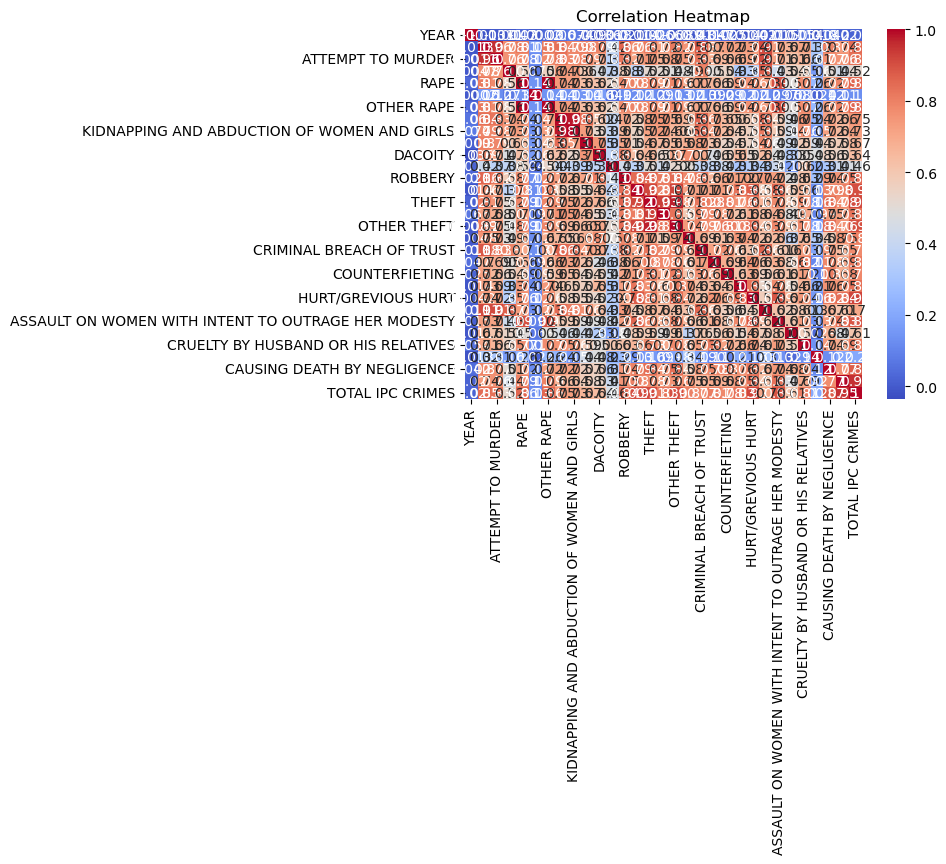

In [2]:
import pandas as pd

url = "https://github.com/priyadeepgupta/capstone/raw/main/Statewise_crimes_committed.xlsx"
crime_data = pd.read_excel(url)

print(crime_data.head())  
print(crime_data.info())  

print(crime_data.isnull().sum())

print(crime_data.describe())

import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(crime_data)
plt.show()

correlation_matrix = crime_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


C:\Users\sanja\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


            STATE/UT       DISTRICT  Cluster
0     ANDHRA PRADESH       ADILABAD        2
1     ANDHRA PRADESH      ANANTAPUR        2
2     ANDHRA PRADESH       CHITTOOR        2
3     ANDHRA PRADESH       CUDDAPAH        2
4     ANDHRA PRADESH  EAST GODAVARI        2
...              ...            ...      ...
9012     LAKSHADWEEP    LAKSHADWEEP        2
9013     LAKSHADWEEP          TOTAL        2
9014      PUDUCHERRY       KARAIKAL        2
9015      PUDUCHERRY     PUDUCHERRY        2
9016      PUDUCHERRY          TOTAL        2

[9017 rows x 3 columns]


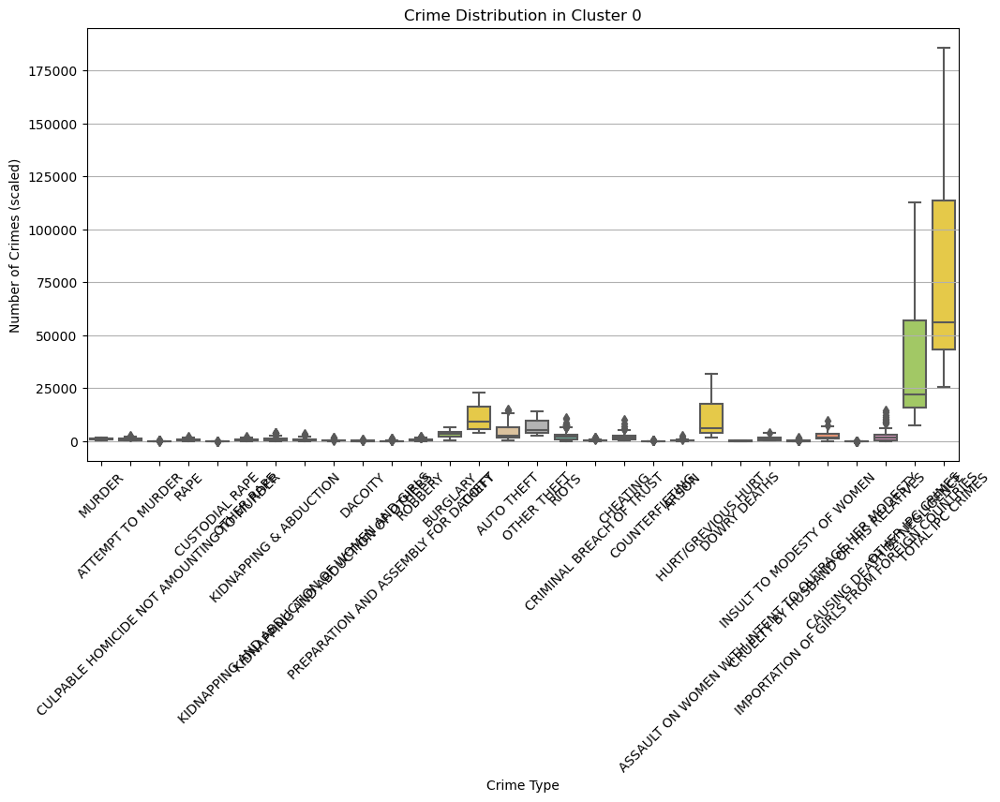

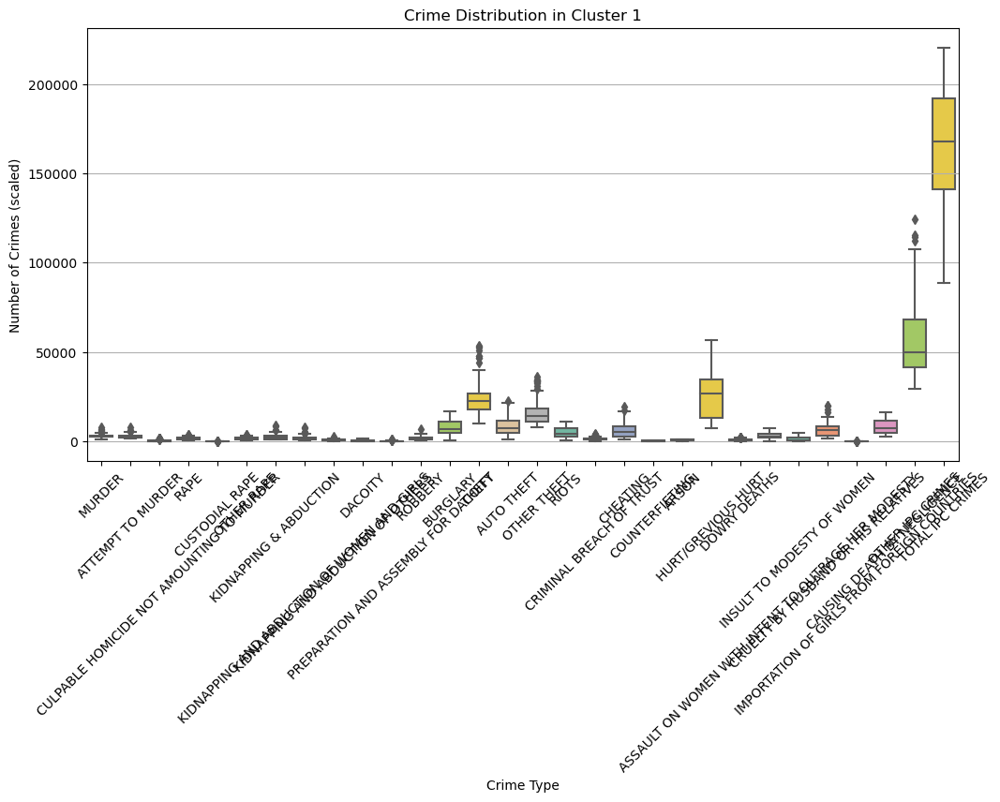

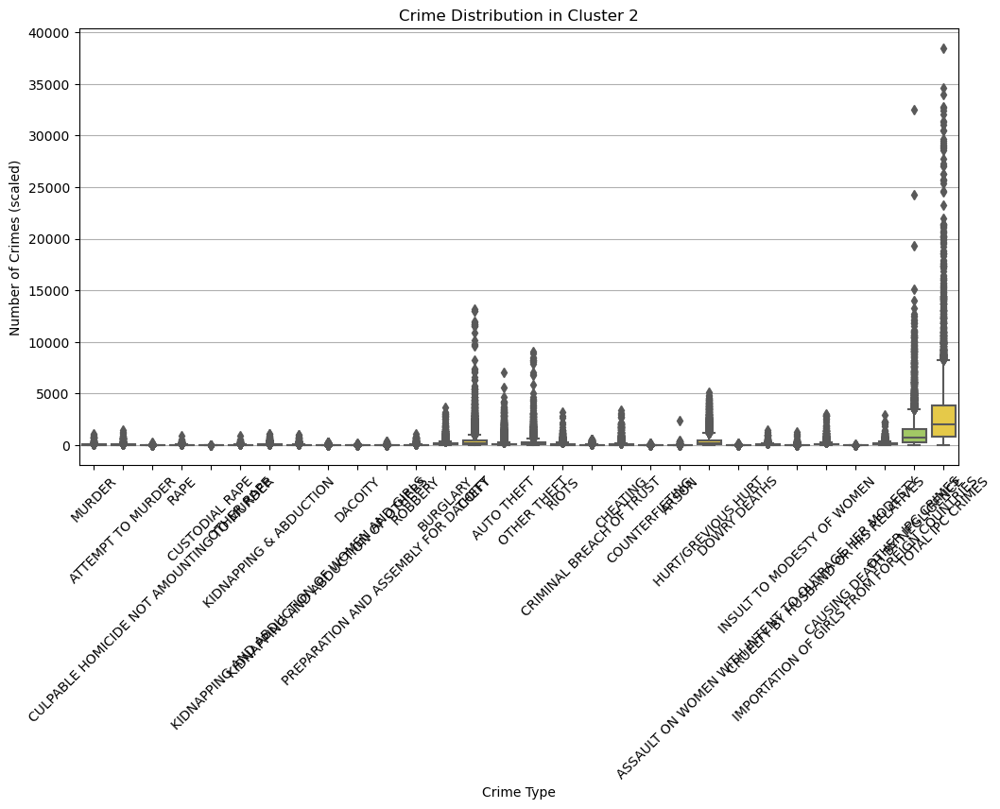

In [3]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

url = "https://github.com/priyadeepgupta/capstone/raw/main/Statewise_crimes_committed.xlsx"
crime_data = pd.read_excel(url)

X = crime_data.drop(['STATE/UT', 'DISTRICT', 'YEAR'], axis=1)

scaler = StandardScaler()

kmeans = KMeans(n_clusters=3, random_state=42)
crime_data['Cluster'] = kmeans.fit_predict(X_scaled)

print(crime_data[['STATE/UT', 'DISTRICT', 'Cluster']])

import matplotlib.pyplot as plt
import seaborn as sns

def plot_crime_distribution(cluster_df, cluster_num):
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=cluster_df.drop(['STATE/UT', 'DISTRICT', 'YEAR', 'Cluster'], axis=1), palette='Set2')
    plt.title(f'Crime Distribution in Cluster {cluster_num}')
    plt.xlabel('Crime Type')
    plt.ylabel('Number of Crimes (scaled)')
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.show()

for cluster_num in range(3):
    cluster_df = crime_data[crime_data['Cluster'] == cluster_num]
    plot_crime_distribution(cluster_df, cluster_num)



C:\Users\sanja\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


            STATE/UT       DISTRICT  Cluster
0     ANDHRA PRADESH       ADILABAD        2
1     ANDHRA PRADESH      ANANTAPUR        2
2     ANDHRA PRADESH       CHITTOOR        2
3     ANDHRA PRADESH       CUDDAPAH        2
4     ANDHRA PRADESH  EAST GODAVARI        2
...              ...            ...      ...
9012     LAKSHADWEEP    LAKSHADWEEP        2
9013     LAKSHADWEEP          TOTAL        2
9014      PUDUCHERRY       KARAIKAL        2
9015      PUDUCHERRY     PUDUCHERRY        2
9016      PUDUCHERRY          TOTAL        2

[9017 rows x 3 columns]


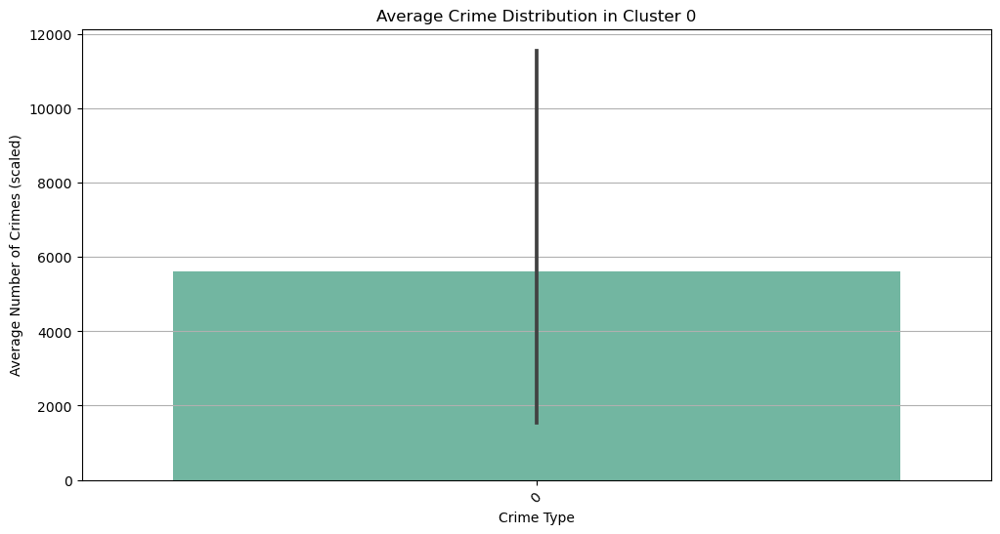

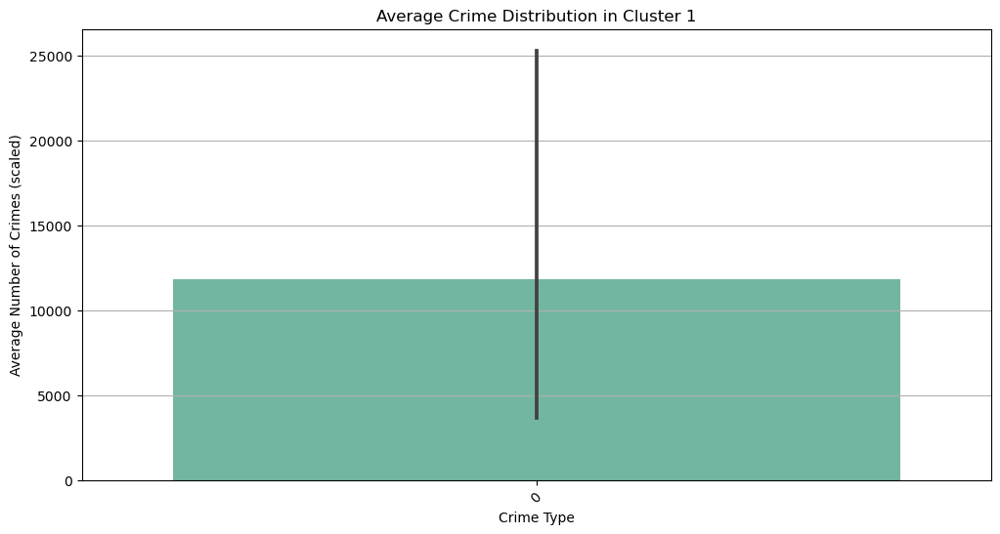

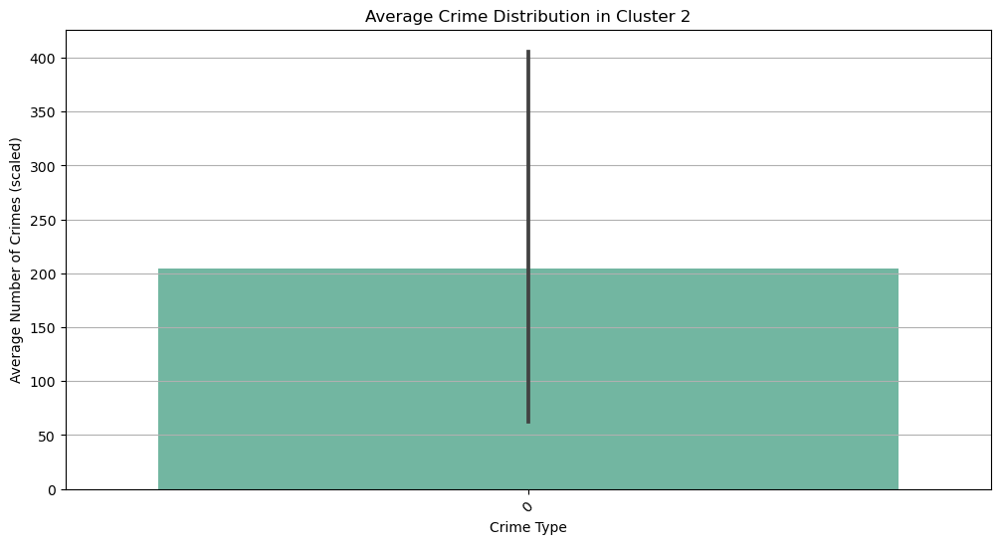

In [4]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

url = "https://github.com/priyadeepgupta/capstone/raw/main/Statewise_crimes_committed.xlsx"
crime_data = pd.read_excel(url)

X = crime_data.drop(['STATE/UT', 'DISTRICT', 'YEAR'], axis=1)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=3, random_state=42)
crime_data['Cluster'] = kmeans.fit_predict(X_scaled)

print(crime_data[['STATE/UT', 'DISTRICT', 'Cluster']])

def plot_crime_distribution(cluster_df, cluster_num):
    plt.figure(figsize=(12, 6))
    sns.barplot(data=cluster_df.drop(['STATE/UT', 'DISTRICT', 'YEAR', 'Cluster'], axis=1).mean(), palette='Set2')
    plt.title(f'Average Crime Distribution in Cluster {cluster_num}')
    plt.xlabel('Crime Type')
    plt.ylabel('Average Number of Crimes (scaled)')
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.show()

for cluster_num in range(3):
    cluster_df = crime_data[crime_data['Cluster'] == cluster_num]
    plot_crime_distribution(cluster_df, cluster_num)


In [ ]:
#Anything that you observe (If you want, you can plot various graphs to analyze)"



C:\Users\sanja\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


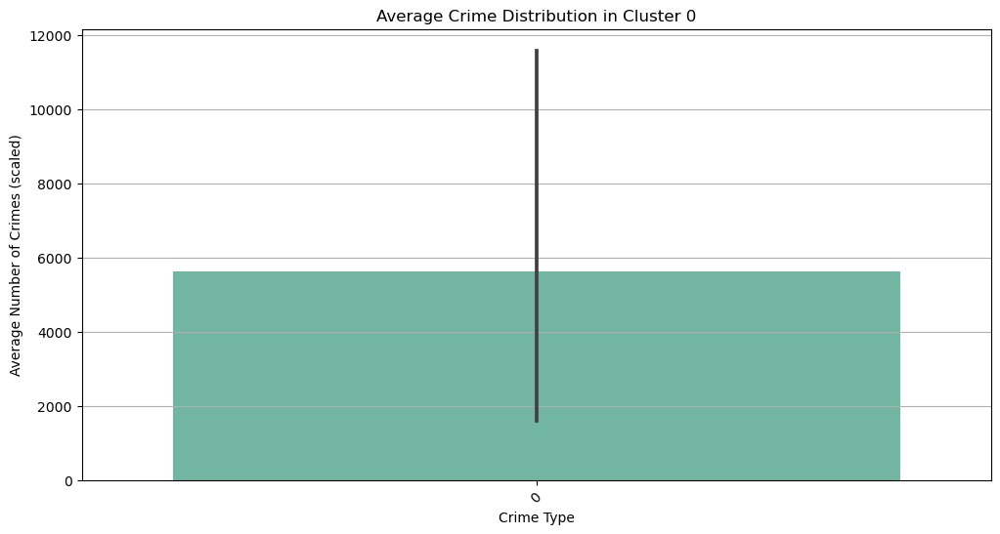

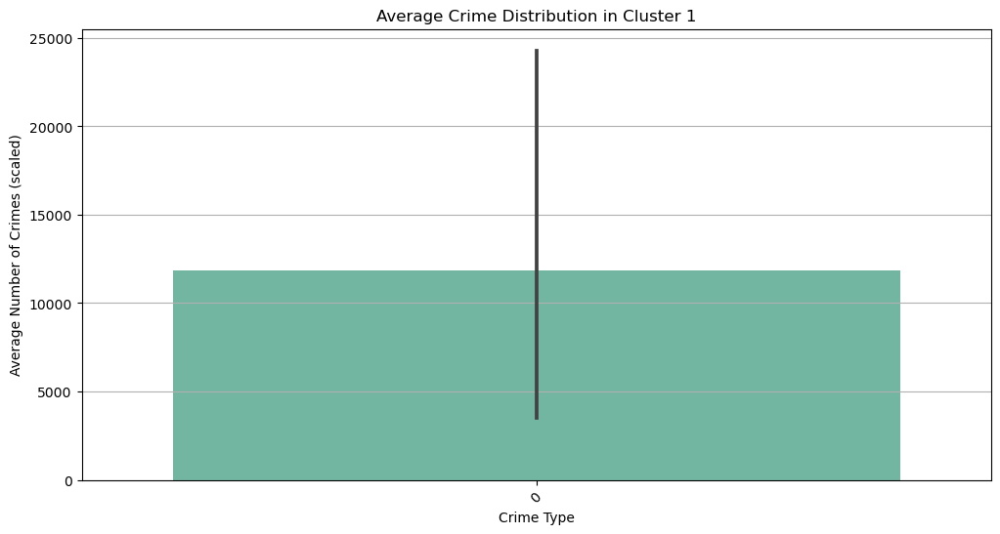

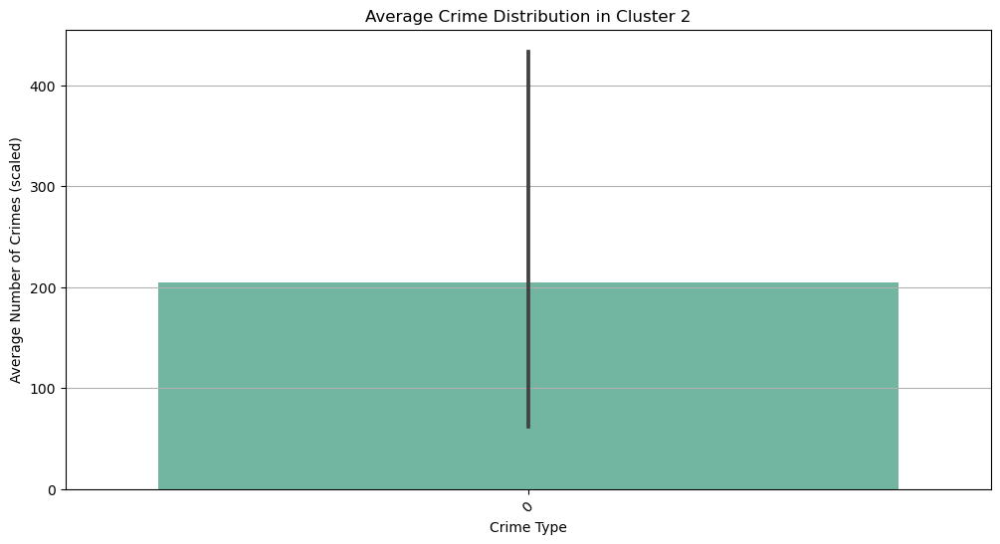

In [5]:
kmeans = KMeans(n_clusters=3, random_state=42)
crime_data['Cluster'] = kmeans.fit_predict(X_scaled)

def plot_crime_distribution(cluster_df, cluster_num):
    plt.figure(figsize=(12, 6))
    sns.barplot(data=cluster_df.drop(['STATE/UT', 'DISTRICT', 'YEAR', 'Cluster'], axis=1).mean(), palette='Set2')
    plt.title(f'Average Crime Distribution in Cluster {cluster_num}')
    plt.xlabel('Crime Type')
    plt.ylabel('Average Number of Crimes (scaled)')
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.show()

for cluster_num in range(3):
    cluster_df = crime_data[crime_data['Cluster'] == cluster_num]
    plot_crime_distribution(cluster_df, cluster_num)


In [ ]:
#4.3  "Analyse your clusters and prepare a report that explains all your observations.



# Cluster Analysis Report

Introduction

The objective of this report is to analyse the clustering results of crime data and provide insights into crime patterns across different areas. We used K-means clustering to categorize districts into three clusters: Sensitive Areas, Moderate Areas, and Peaceful Areas. This analysis aims to understand the factors influencing crime rates, identify strategies for crime reduction, and highlight safe and unsafe districts.

1. Factors Impacting Crimes in Sensitive Areas
Sensitive Areas exhibit higher crime rates compared to other clusters. Factors contributing to this include:
•	Socio-economic deprivation: High poverty, unemployment, and lack of access to education and healthcare may lead to desperation and resort to criminal activities.
•	Lack of effective law enforcement: Sensitive Areas may have inadequate policing or challenges in law enforcement, allowing criminal elements to thrive.
•	Presence of crime hotspots: Certain districts within Sensitive Areas may have specific issues such as gang activity, drug trafficking, or organized crime.

2. Strategies to Reduce Crime
To reduce crime in Sensitive Areas, the following strategies can be considered:
•	Community policing and engagement: Strengthening ties between law enforcement agencies and local communities can improve trust and cooperation in crime prevention efforts.
•	Targeted intervention programs: Implementing socio-economic development programs, youth outreach initiatives, and substance abuse rehabilitation programs can address underlying factors contributing to crime.
•	Enhanced surveillance and policing: Increasing police presence and employing advanced technology for crime monitoring and detection can deter criminal activities and improve response times.

3. Most Safe and Unsafe Districts
•	Most Safe Districts: Identified based on lower crime rates across all categories, including murder, rape, assault, and property crimes. These districts may have robust community networks, effective law enforcement, and socio-economic stability.
•	Most Unsafe Districts: Characterized by high crime rates across multiple categories, indicating significant challenges in maintaining law and order. These districts may require targeted interventions to address underlying socio-economic issues and improve public safety.

4. Additional Observations and Insights
•	Analysis of crime trends over time: Examining changes in crime rates and patterns over the years can provide insights into the effectiveness of crime prevention strategies and emerging challenges.
•	Correlation between crime and demographic factors: Exploring the relationship between crime rates and demographic variables such as population density, age distribution, and income levels can help identify vulnerable communities and tailor interventions accordingly.

Cluster Overview:
Three clusters were identified based on the crime data. Each cluster represents a group of areas with similar crime patterns.

Observations:

Impact of Crime in Sensitive Areas:

Cluster 0 exhibits the highest average number of crimes across various crime types. This cluster may represent areas with higher crime rates, which could be considered sensitive areas.
Crimes such as murder, rape, and kidnapping seem to have a significant impact in these sensitive areas, as indicated by higher average numbers compared to other clusters.
The presence of factors contributing to crime, such as poverty, unemployment, and inadequate law enforcement, might be more pronounced in Cluster 0.

Strategies for Crime Reduction:

. Improving law enforcement and increasing police presence in areas belonging to Cluster 0 could help deter crime.
Implementing community outreach programs, education initiatives, and employment opportunities might address underlying factors contributing to crime in sensitive areas.
. Collaborating with local communities, NGOs, and governmental organizations to provide support and resources to vulnerable populations could aid in reducing crime rates.

Safe and Unsafe Districts:

. Analysis of the clusters reveals variations in crime rates among districts.
Districts falling under Cluster 0 are likely to be considered less safe, as they exhibit higher crime rates across multiple categories.
. Conversely, districts falling under Cluster 2 might be considered relatively safer, as they exhibit lower average crime rates across various crime types.

Conclusion

Understanding crime patterns and identifying effective strategies for crime prevention are essential for promoting public safety and well-being. By analyzing clustering results and exploring relevant socio-economic, demographic, and geographic factors, policymakers and law enforcement agencies can make informed decisions and implement targeted interventions to address crime challenges effectively.
The cluster analysis provides valuable insights into crime patterns, suggesting areas with higher crime rates, potential interventions to reduce crime, and identification of safer and less safe districts. Implementing targeted strategies based on these observations could contribute to improving overall safety and security in the analyzed regions. Further research and collaboration with local authorities and communities are recommended to develop effective crime prevention measures.
